In [1]:
import gym
from gym import spaces
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

class UAVEnv(gym.Env):
    """Custom Environment that follows gym interface for a UAV."""
    metadata = {'render.modes': ['human']}
    
    def __init__(self, goal_position=np.array([10, 10, 10]), max_steps=100):
        super(UAVEnv, self).__init__()
        self.env_bounds = (100, 100, 30)  # Bounds of the environment including z-axis
        self.goal_position = goal_position
        self.max_steps = max_steps
        self.current_step = 0
        self.state = np.array([0, 0, 0, 0, 0, 0])  # Initial state: x, y, z, dx, dy, dz
        self.previous_distance = np.linalg.norm(self.state[:3] - self.goal_position)
        self.path = []
        self.obstacles = [
            {'type': 'rectangle', 'position': (2, 2, 15), 'width': 1, 'height': 1, 'depth': 15},
            {'type': 'circle', 'position': (5, 5, 20), 'radius': 1, 'depth': 20},
            {'type': 'ellipse', 'position': (2.5, 7.5, 25), 'width': 2, 'height': 1, 'depth': 25}
        ]
        self.action_space = spaces.Discrete(6)
        self.observation_space = spaces.Box(low=np.array([-10, -10, 0, -1, -1, -1]),
                                            high=np.array([10, 10, 30, 1, 1, 1]),
                                            dtype=np.float32)

    def step(self, action):
        self._take_action(action)
        self.current_step += 1
        self.path.append(self.state[:3].copy())
        done = self._is_done()
        reward = self._get_reward()
        return np.array(self.state), reward, done, {}

    def reset(self):
        self.current_step = 0
        self.state = np.array([0, 0, 0, 0, 0, 0])  # Reset state
        self.previous_distance = np.linalg.norm(self.state[:3] - self.goal_position)
        self.path = []
        return np.array(self.state)

    def render(self, mode='human'):
        if mode == 'human':
            x, y, z, dx, dy, dz = self.state
            fig, ax = plt.subplots(figsize=(10, 10))
            
            # Goal and UAV positions
            ax.scatter(self.goal_position[0], self.goal_position[1], c='red', s=100, label='Goal', alpha=0.5)
            ax.scatter(x, y, c='blue', s=100, label='UAV', alpha=0.5)
            
            # UAV Path
            if self.path:
                path_array = np.array(self.path)
                ax.plot(path_array[:, 0], path_array[:, 1], label='Path', color='blue', alpha=0.6)
            
            # Axis limits
            ax.set_xlim(self.observation_space.low[0], self.observation_space.high[0])
            ax.set_ylim(self.observation_space.low[1], self.observation_space.high[1])
            
            # Labels and Title
            ax.set_xlabel('X Position')
            ax.set_ylabel('Y Position')
            ax.set_title('UAV Navigation Environment')
            
            # Obstacles rendering
            for obstacle in self.obstacles:
                if obstacle['type'] == 'rectangle':
                    rect = patches.Rectangle((obstacle['position'][0] - obstacle['width'] / 2,
                                              obstacle['position'][1] - obstacle['height'] / 2),
                                             obstacle['width'], obstacle['height'],
                                             linewidth=1, edgecolor='r', facecolor='none')
                    ax.add_patch(rect)
                elif obstacle['type'] == 'circle':
                    circle = patches.Circle((obstacle['position'][0], obstacle['position'][1]),
                                            obstacle['radius'], linewidth=1, edgecolor='b', facecolor='none')
                    ax.add_patch(circle)
                elif obstacle['type'] == 'ellipse':
                    ellipse = patches.Ellipse((obstacle['position'][0], obstacle['position'][1]),
                                              obstacle['width'], obstacle['height'], linewidth=1, edgecolor='g', facecolor='none')
                    ax.add_patch(ellipse)
            
            # Legend and Grid
            ax.legend()
            ax.grid(True)
            plt.show()
    def _detect_collision(self, new_position):
        for obstacle in self.obstacles:
            # Collision detection for rectangle
            if obstacle['type'] == 'rectangle':
                rect_min_x = obstacle['position'][0] - obstacle['width'] / 2
                rect_max_x = obstacle['position'][0] + obstacle['width'] / 2
                rect_min_y = obstacle['position'][1] - obstacle['height'] / 2
                rect_max_y = obstacle['position'][1] + obstacle['height'] / 2
                if rect_min_x <= new_position[0] <= rect_max_x and rect_min_y <= new_position[1] <= rect_max_y:
                    return True
            # Collision detection for circle
            elif obstacle['type'] == 'circle':
                distance = np.linalg.norm(np.array(obstacle['position'][:2]) - new_position[:2])
                if distance <= obstacle['radius']:
                    return True
            # Collision detection for ellipse
            elif obstacle['type'] == 'ellipse':
                # Simplified ellipse detection
                distance = np.linalg.norm(np.array(obstacle['position'][:2]) - new_position[:2])
                if distance <= max(obstacle['width'], obstacle['height']):
                    return True
        return False

    def _take_action(self, action):
        x, y, z, dx, dy, dz = self.state
        speed_change = 0.1
        if action == 0: dz += speed_change
        elif action == 1: dz -= speed_change
        elif action == 2: dx -= speed_change
        elif action == 3: dx += speed_change
        elif action == 4: dy += speed_change
        elif action == 5: dy -= speed_change
        damping_factor = 0.95
        dx *= damping_factor
        dy *= damping_factor
        dz *= damping_factor
        x += dx
        y += dy
        z += dz
        x = np.clip(x, self.observation_space.low[0], self.observation_space.high[0])
        y = np.clip(y, self.observation_space.low[1], self.observation_space.high[1])
        z = np.clip(z, self.observation_space.low[2], self.observation_space.high[2])
        self.state = np.array([x, y, z, dx, dy, dz])

        # New position based on current action
        new_position = np.array([x + dx, y + dy, z + dz])
        
        # Check for collision
        if self._detect_collision(new_position):
            # Handle collision (e.g., reset position, apply penalty, etc.)
            print("Collision detected! Taking avoidance measures.")
            # For example, undo the move which causes the collision
            dx = dy = dz = 0
        else:
            # Update state only if no collision
            self.state = np.array([x + dx, y + dy, z + dz, dx, dy, dz])

    def _get_proximity_penalty(self, current_position):
        penalty = 0
        # Define a minimum safe distance
        safe_distance = 1.0
    
        for obstacle in self.obstacles:
            # Check proximity for rectangles
            if obstacle['type'] == 'rectangle':
                rect_min_x = obstacle['position'][0] - obstacle['width'] / 2 - safe_distance
                rect_max_x = obstacle['position'][0] + obstacle['width'] / 2 + safe_distance
                rect_min_y = obstacle['position'][1] - obstacle['height'] / 2 - safe_distance
                rect_max_y = obstacle['position'][1] + obstacle['height'] / 2 + safe_distance
                if rect_min_x <= current_position[0] <= rect_max_x and rect_min_y <= current_position[1] <= rect_max_y:
                    penalty += (safe_distance - min(abs(current_position[0] - rect_min_x),
                                                    abs(current_position[0] - rect_max_x),
                                                    abs(current_position[1] - rect_min_y),
                                                    abs(current_position[1] - rect_max_y)))
    
            # Proximity check for circles
            elif obstacle['type'] == 'circle':
                distance = np.linalg.norm(np.array(obstacle['position'][:2]) - current_position[:2])
                if distance < obstacle['radius'] + safe_distance:
                    penalty += (obstacle['radius'] + safe_distance - distance)
    
            # Proximity check for ellipses
            elif obstacle['type'] == 'ellipse':
                # Simplified ellipse proximity check
                distance = np.linalg.norm(np.array(obstacle['position'][:2]) - current_position[:2])
                if distance < max(obstacle['width'], obstacle['height']) + safe_distance:
                    penalty += (max(obstacle['width'], obstacle['height']) + safe_distance - distance)
    
        return penalty

    
    def _get_reward(self):
        current_position = self.state[:3]
        goal_distance = np.linalg.norm(current_position - self.goal_position)
        if self.current_step == 0:
            self.previous_distance = goal_distance
        reward = self.previous_distance - goal_distance
        self.previous_distance = goal_distance
        speed_penalty = -np.linalg.norm(self.state[3:]) * 0.05
        if goal_distance < 1:
            reward += 100  # Large reward for reaching the goal
        return reward + speed_penalty

        # Check if UAV is too close to any obstacles and apply a penalty
        penalty_for_proximity_to_obstacles = -10 if self._detect_collision(self.state[:3]) else 0
    
        return reward + speed_penalty + penalty_for_proximity_to_obstacles

        proximity_penalty = self._get_proximity_penalty(self.state[:3])
        return reward + speed_penalty - proximity_penalty

    def _is_done(self):
        current_position = self.state[:3]
        goal_distance = np.linalg.norm(current_position - self.goal_position)
        if goal_distance < 1:
            print("Goal reached!")
            return True
        if self.current_step >= self.max_steps:
            print("Max steps exceeded.")
            return True

        if self._detect_collision(self.state[:3]):
            print("Collision with an obstacle!")
            return True
        return False

    def seed(self, seed=None):
        np.random.seed(seed)


C:\Users\ammar\myuav\Lib\site-packages\gym\spaces\box.py:127: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")


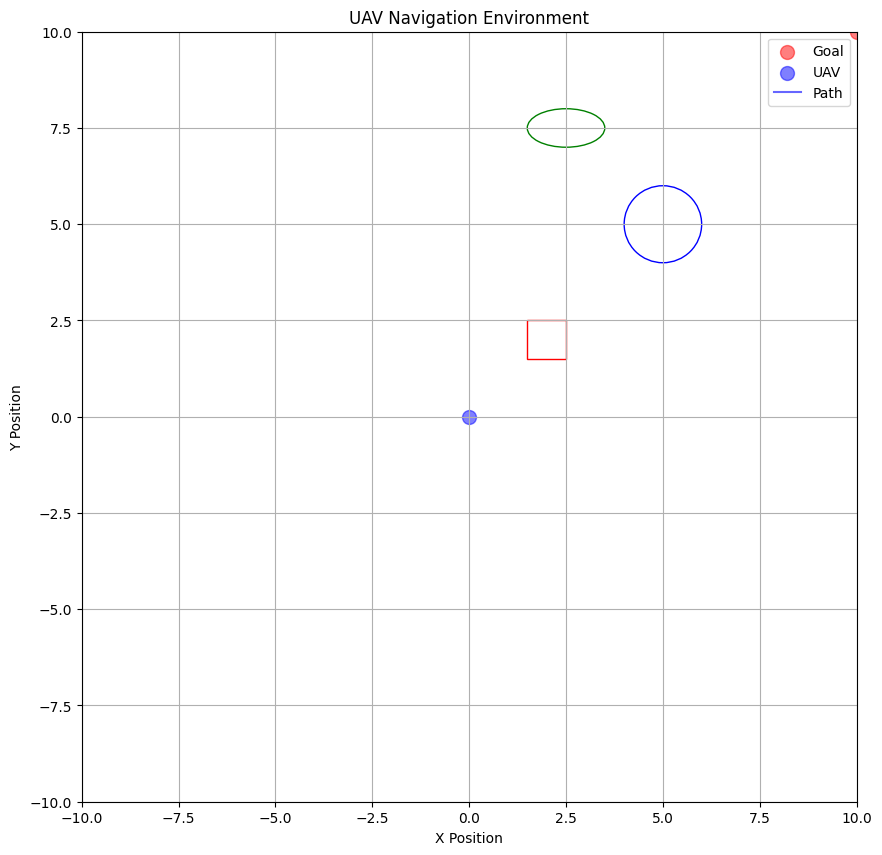

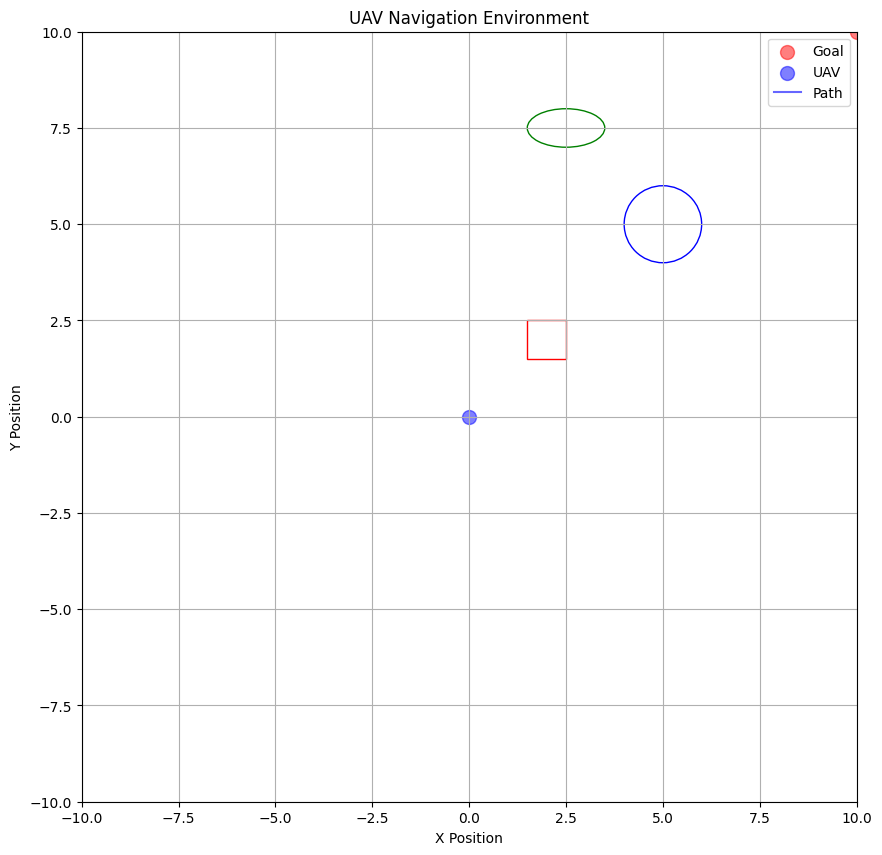

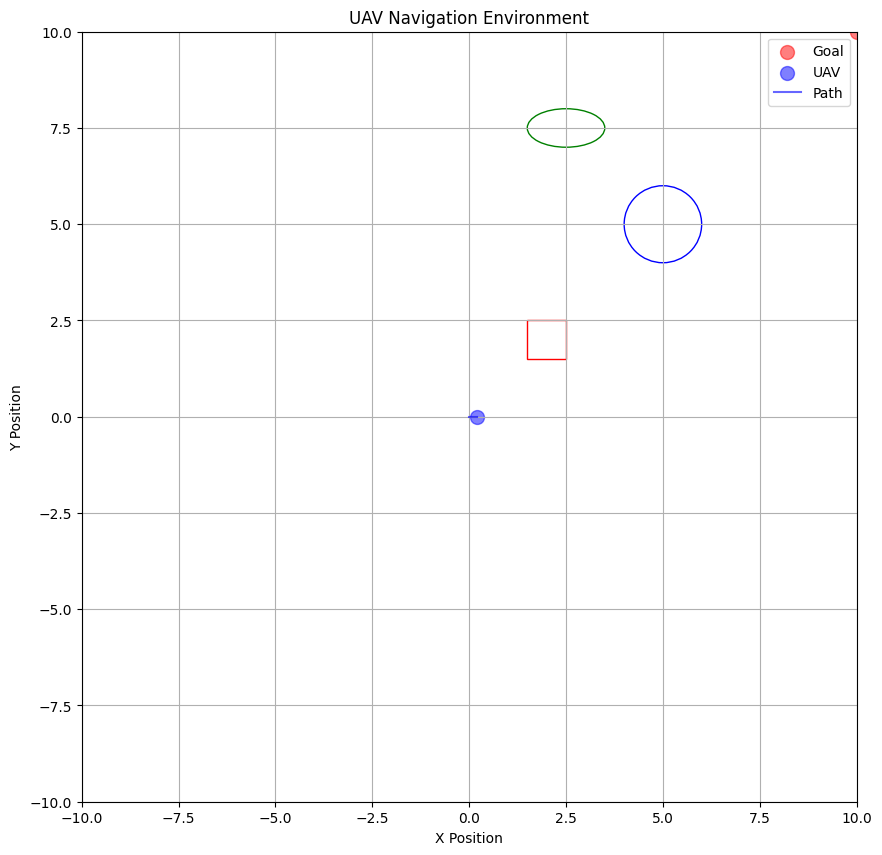

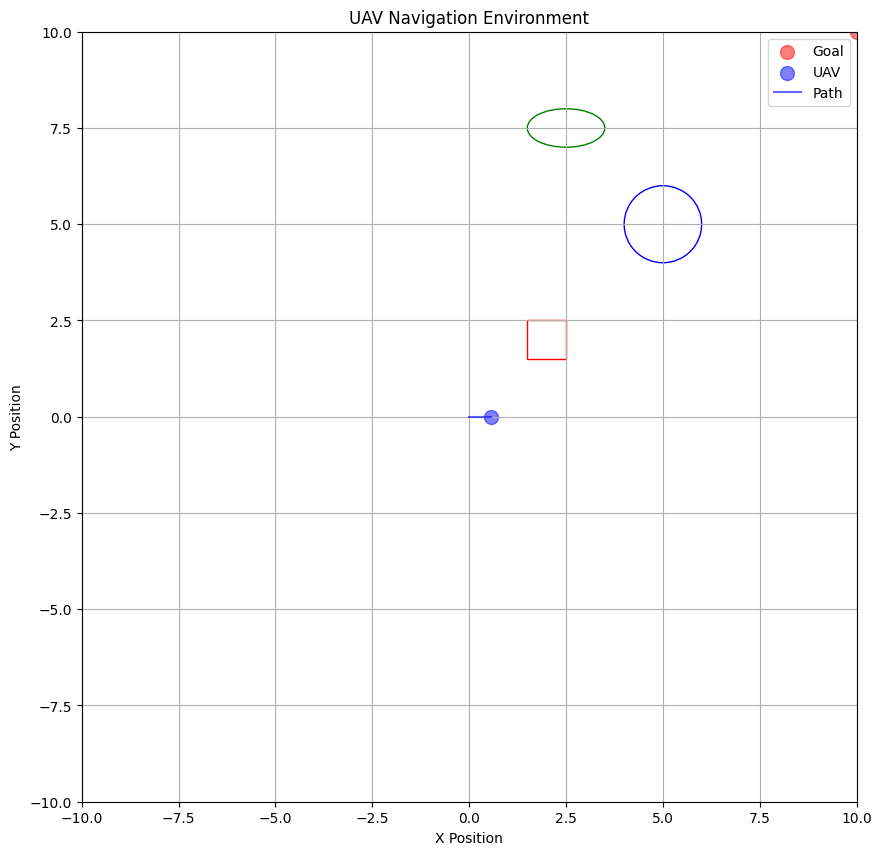

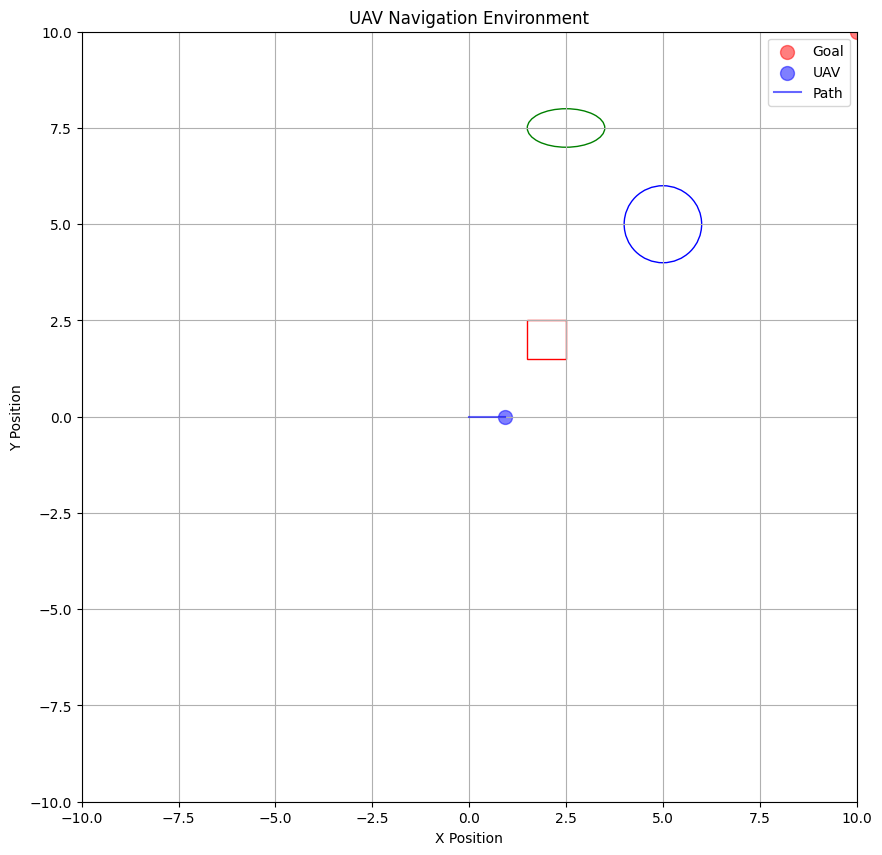

...

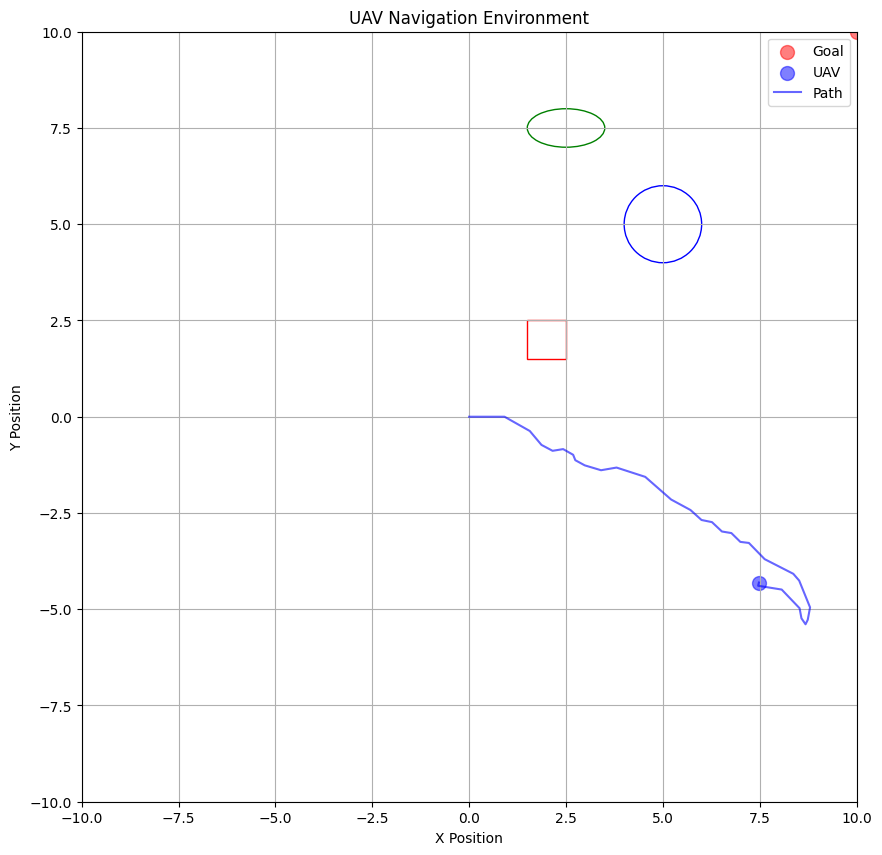

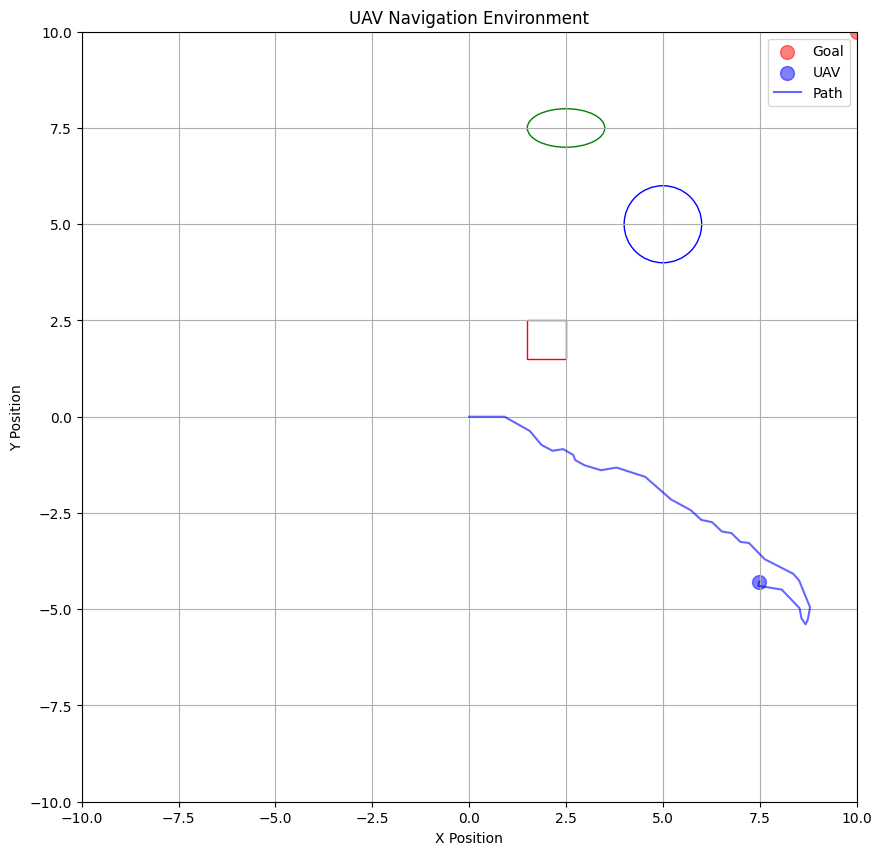

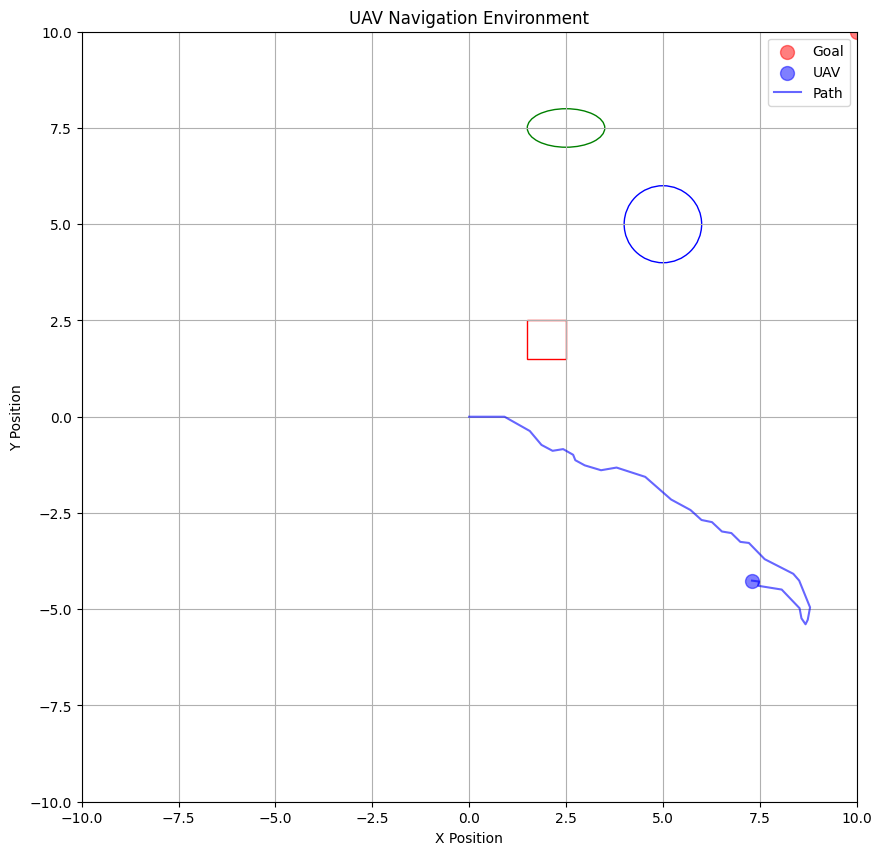

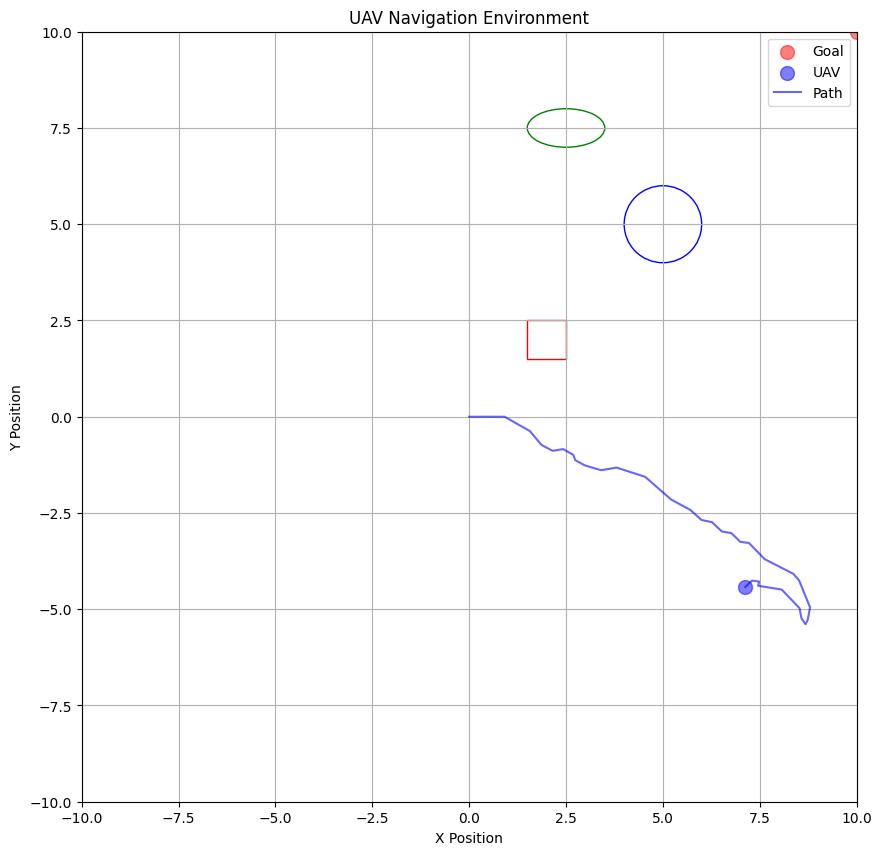

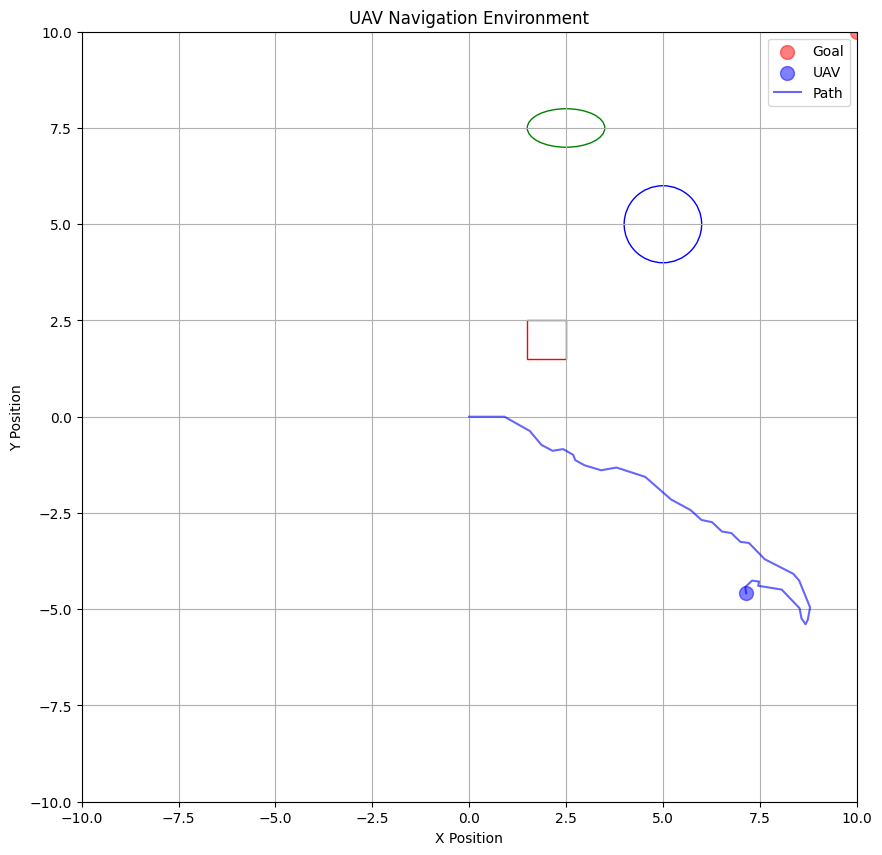

In [2]:
# Example usage
env = UAVEnv()
state = env.reset()
for _ in range(50):
    action = env.action_space.sample()
    state, reward, done, info = env.step(action)
    if done:
        break
    env.render()


In [6]:
from stable_baselines3 import PPO
from stable_baselines3.common.env_util import make_vec_env
from stable_baselines3.common.evaluation import evaluate_policy

env = make_vec_env(lambda: UAVEnv(), n_envs=4)
model = PPO("MlpPolicy", env, verbose=1,
            learning_rate=0.0005,  
            ent_coef=0.01,  
            n_steps=2048,
            batch_size=32,
            n_epochs=10,
            gamma=0.99,
            gae_lambda=0.95,
            clip_range=0.2,
            policy_kwargs=dict(net_arch=dict(pi=[128, 64], vf=[128, 64])))
# Training the model
total_timesteps = 25000  
model.learn(total_timesteps=int(total_timesteps))

C:\Users\ammar\myuav\Lib\site-packages\stable_baselines3\common\vec_env\patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


Using cpu device
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstac

In [7]:
# Evaluating the trained agent
mean_reward, _ = evaluate_policy(model, env, n_eval_episodes=20)
print(f"Mean reward: {mean_reward}")

Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Mean reward: 3.8782099999999993


<Figure size 800x800 with 0 Axes>

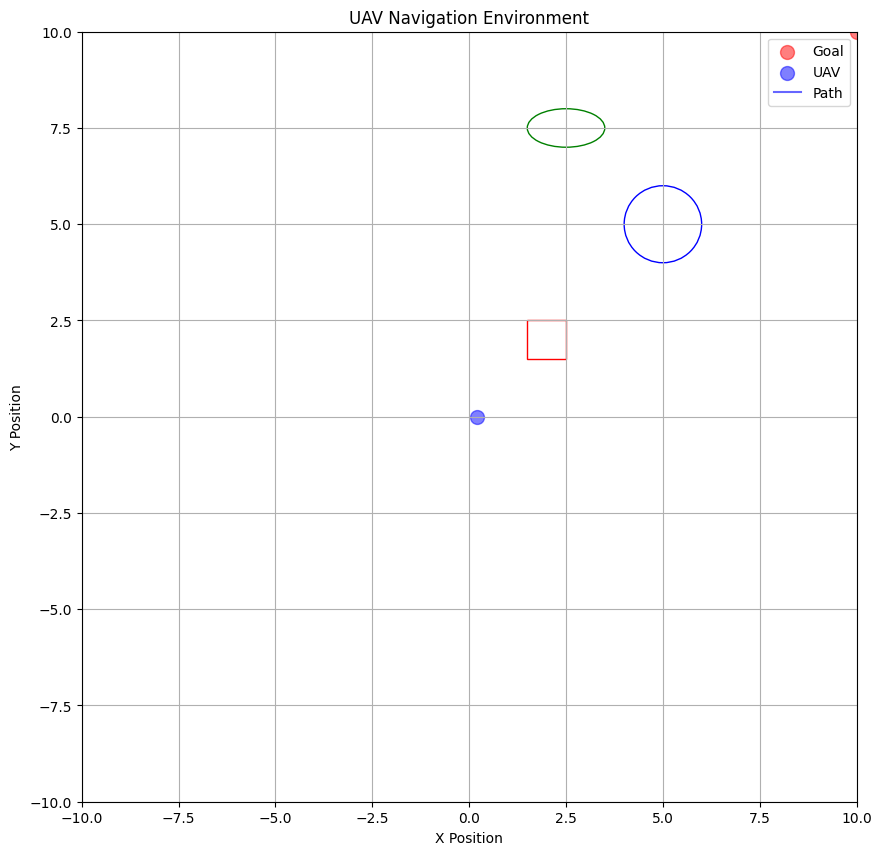

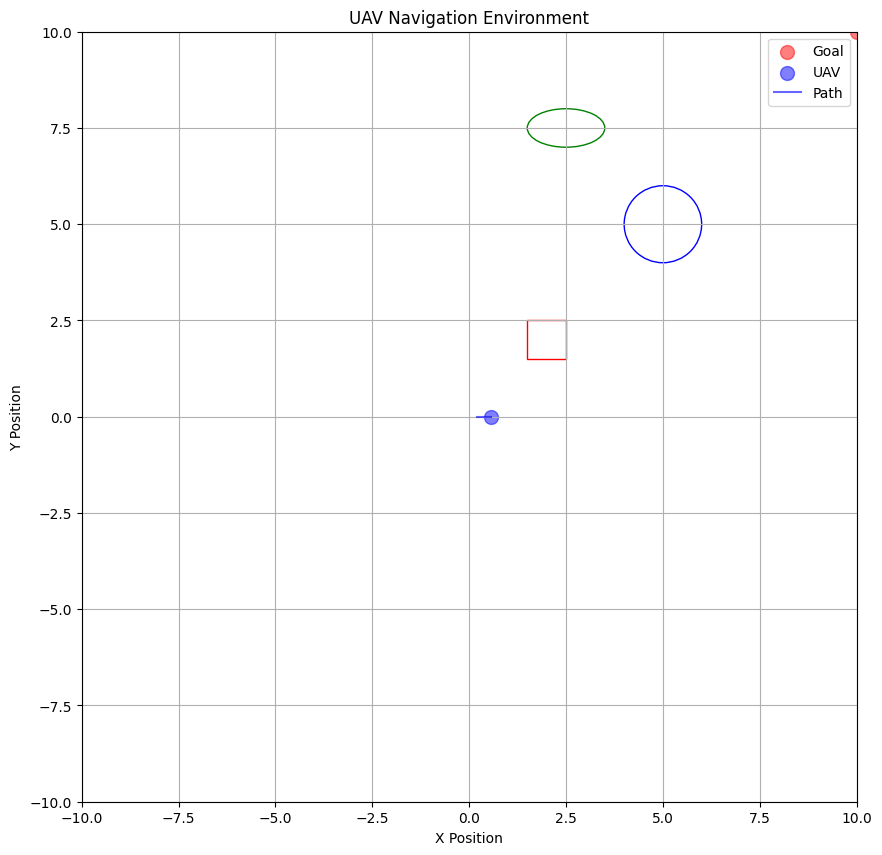

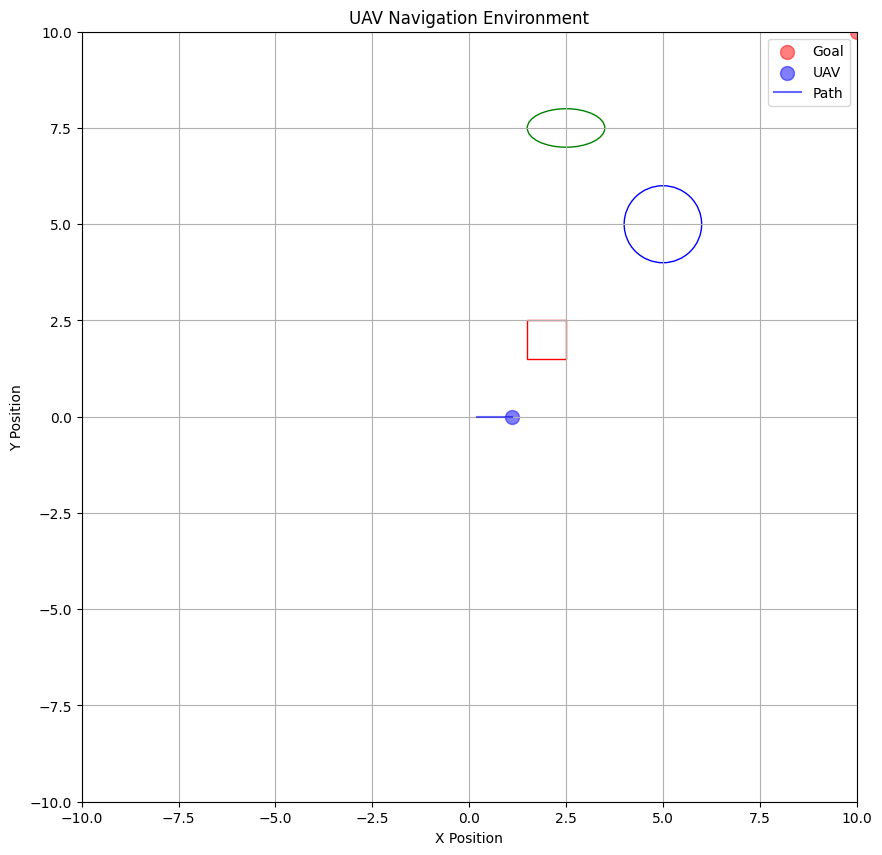

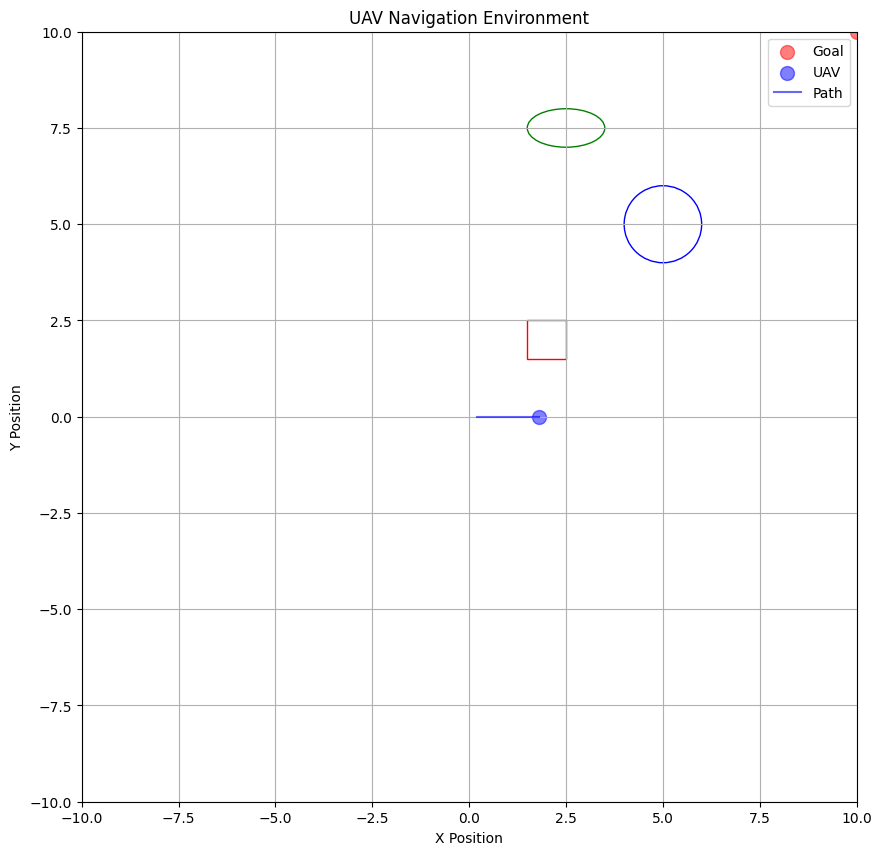

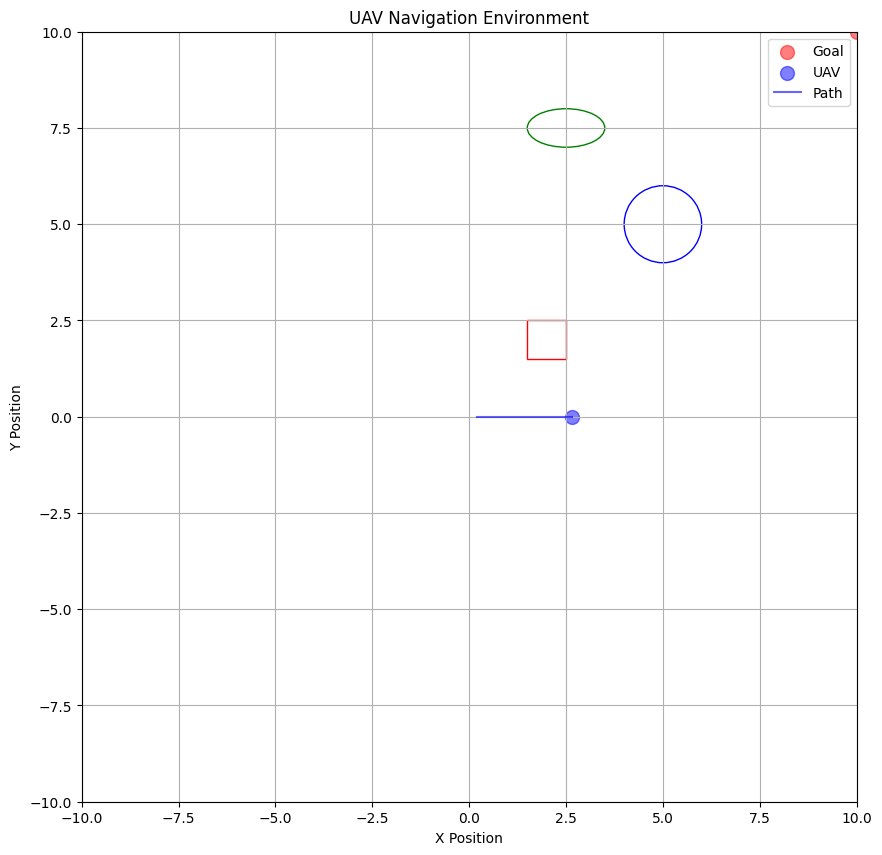

...

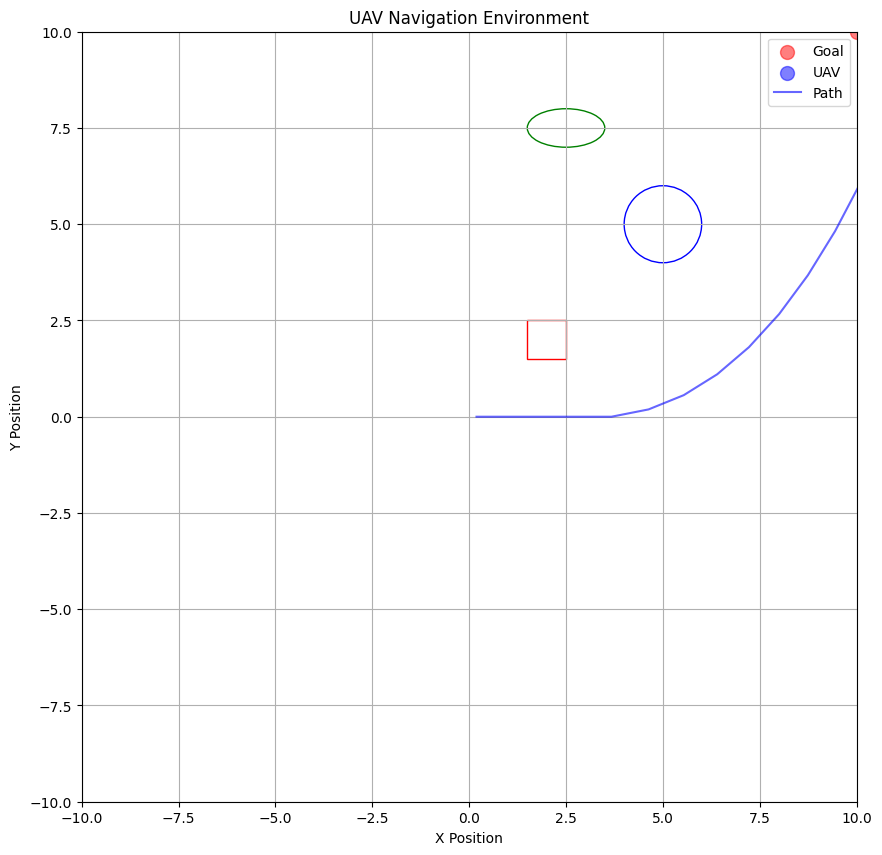

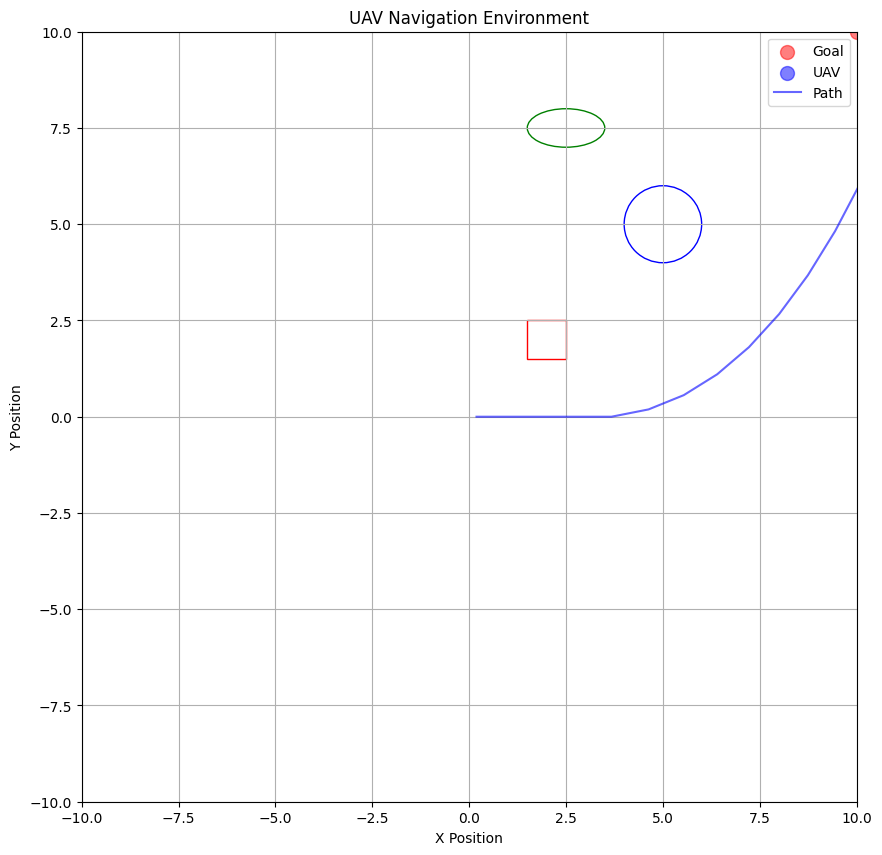

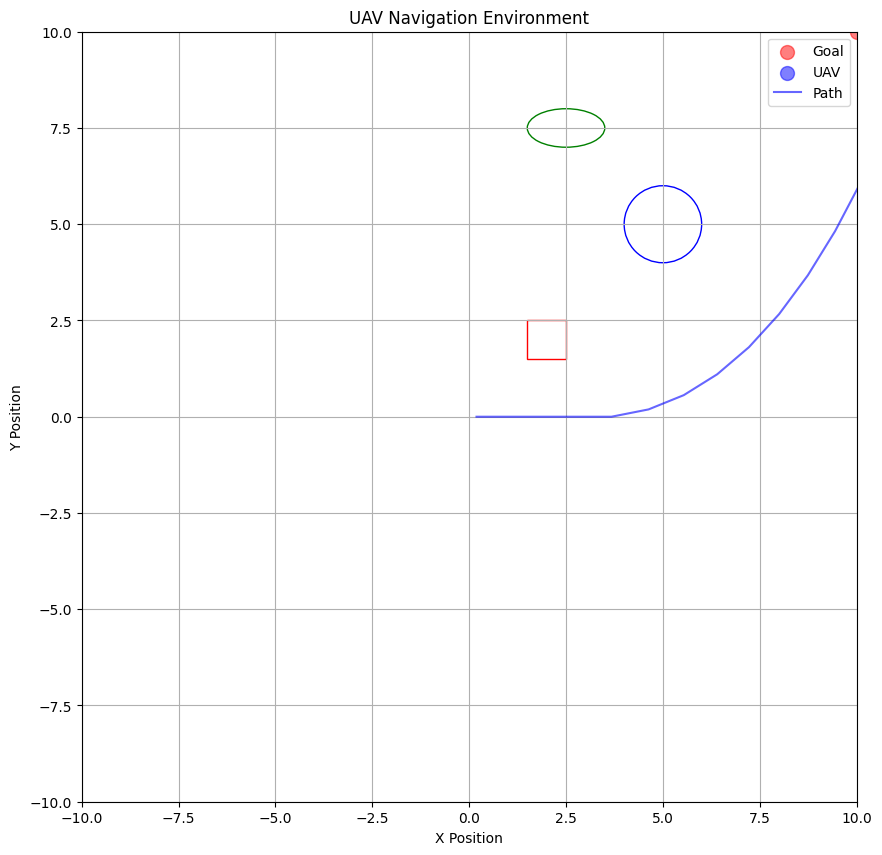

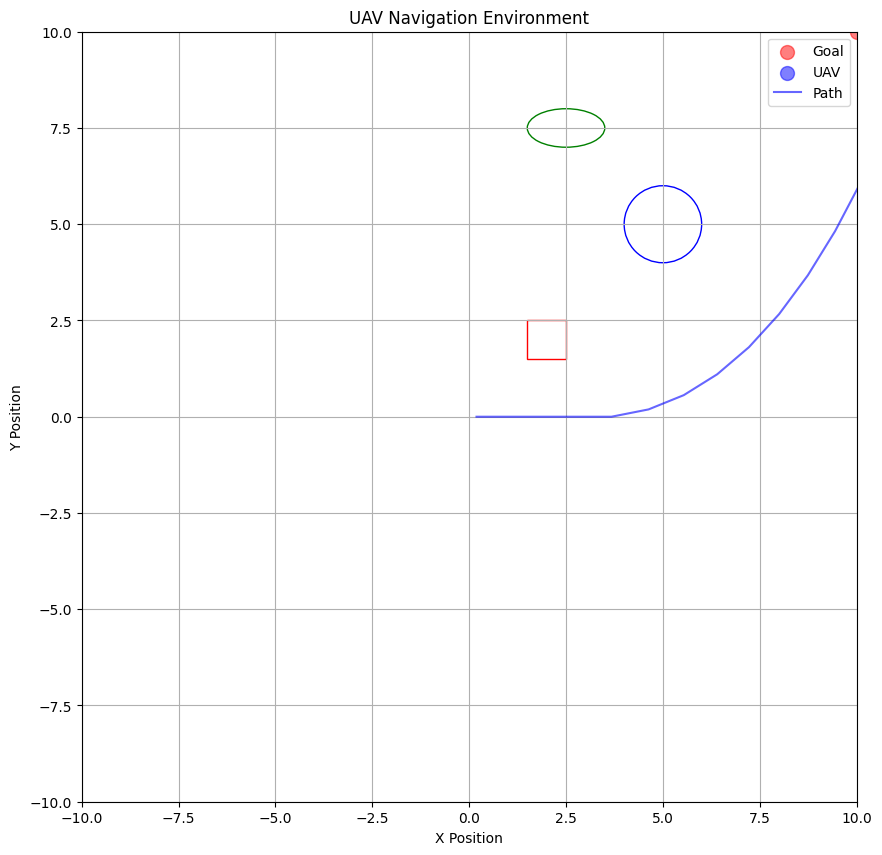

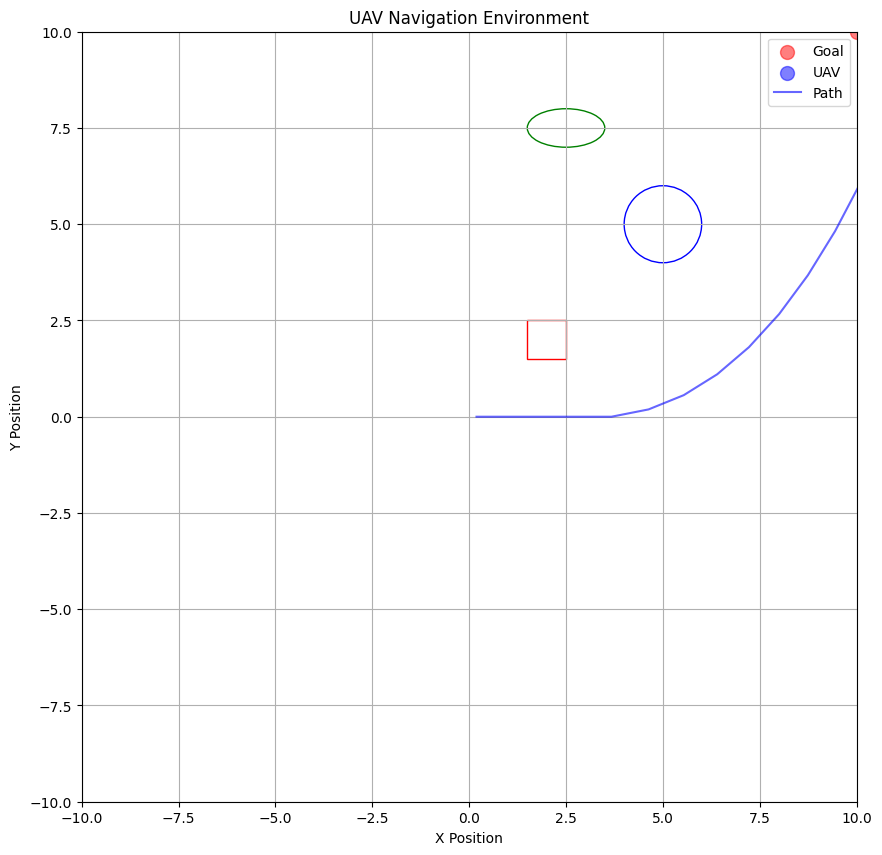

Max steps exceeded.


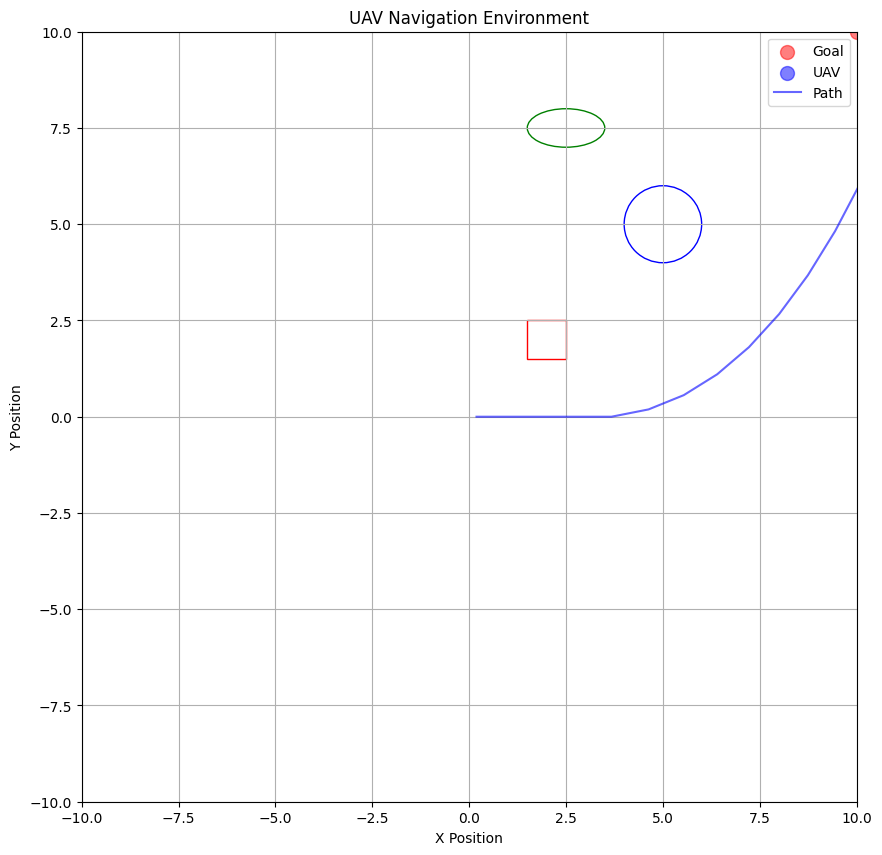

In [8]:
#Visualizing the UAV's 
# Visualize one episode
test_env = UAVEnv()
obs = test_env.reset()
plt.figure(figsize=(8, 8))

for _ in range(500):
    action, _states = model.predict(obs, deterministic=True)
    obs, rewards, dones, info = test_env.step(action)
    test_env.render()
    if dones:
        break

plt.close()  # Close the plot to clean up


In [9]:
import optuna

def objective(trial):
  # Define hyperparameters to tune
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
  n_steps = trial.suggest_categorical('n_steps', [32, 64, 128, 256, 512, 1048])
  batch_size = trial.suggest_categorical('batch_size', [32, 64, 128, 256, 512, 1048])

  # Early stopping criteria
  max_train_iterations = 100  # Adjust this based on your environment complexity
  best_mean_reward = -float('inf')  # Initialize with very negative reward
  patience = 5  # Number of iterations to wait for improvement

  model = PPO("MlpPolicy", env, verbose=1, learning_rate=learning_rate, n_steps=n_steps, batch_size=batch_size)

  for train_iter in range(max_train_iterations):
    model.learn(total_timesteps=1000)  # Train for 1000 timesteps per iteration

    # Evaluate the model after each training iteration
    mean_reward, _ = evaluate_policy(model, env, n_eval_episodes=50)

    # Early stopping logic
    if mean_reward > best_mean_reward:
      best_mean_reward = mean_reward
      patience = 5  # Reset patience counter
    else:
      patience -= 1
      if patience <= 0:
        print(f"Early stopping at iteration {train_iter + 1}")
        break

  return mean_reward

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10)

print('Best trial:', study.best_trial.params)

[I 2024-04-22 16:30:48,835] A new study created in memory with name: no-name-e443be9e-d6c9-4dfd-a69b-43e7178a6e50
C:\Users\ammar\AppData\Local\Temp\ipykernel_2376\2458499552.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
C:\Users\ammar\myuav\Lib\site-packages\stable_baselines3\ppo\ppo.py:155: UserWarning: You have specified a mini-batch size of 512, but because the `RolloutBuffer` is of size `n_steps * n_envs = 4192`, after every 8 untruncated mini-batches, there will be a truncated mini-batch of size 96
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=1048 and n_envs=4)
  warnings.warn(


Using cpu device
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision de

[I 2024-04-22 16:31:55,921] Trial 0 finished with value: 116.14182999999998 and parameters: {'learning_rate': 0.0009282967188968457, 'n_steps': 1048, 'batch_size': 512}. Best is trial 0 with value: 116.14182999999998.


Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Early stopping at iteration 26
Using cpu device
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 85.3     |
|    ep_rew_mean     | -5.37    |
| time/              |          |
|    fps             | 3093     |
|    iterations      | 1        |
|    time_elapsed    | 0        |
|    total_timesteps | 1024     |
---------------------------------
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max ste

[I 2024-04-22 16:32:10,079] Trial 1 finished with value: 1.251872 and parameters: {'learning_rate': 1.7686131219067445e-05, 'n_steps': 256, 'batch_size': 256}. Best is trial 0 with value: 116.14182999999998.


Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measu

C:\Users\ammar\myuav\Lib\site-packages\stable_baselines3\ppo\ppo.py:155: UserWarning: You have specified a mini-batch size of 256, but because the `RolloutBuffer` is of size `n_steps * n_envs = 4192`, after every 16 untruncated mini-batches, there will be a truncated mini-batch of size 96
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=1048 and n_envs=4)
  warnings.warn(


Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Max steps exceeded.
Ma

[I 2024-04-22 16:33:21,999] Trial 2 finished with value: 115.863992 and parameters: {'learning_rate': 0.0005525417902590211, 'n_steps': 1048, 'batch_size': 256}. Best is trial 0 with value: 116.14182999999998.


Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Early stopping at iteration 25
Using cpu device
-----------------------------
| time/              |      |
|    fps             | 3280 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 256  |
-----------------------------
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 100          |
|    ep_rew_mean          | -5.69        |
| time/                   |              |
|    fps                  | 2285         |
|    iterations           | 2            |
|    time_elapsed         | 0            |
|    total_timesteps      | 512          |
| train/                  |              |
|    approx_kl            | 4.800502e-06 |
|    clip_fraction   

[I 2024-04-22 16:33:28,533] Trial 3 finished with value: 2.040409 and parameters: {'learning_rate': 1.801276676415207e-05, 'n_steps': 64, 'batch_size': 256}. Best is trial 0 with value: 116.14182999999998.


Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Early stopping at iteration 6
Using cpu device
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max st

[I 2024-04-22 16:33:50,921] Trial 4 finished with value: 2.298645 and parameters: {'learning_rate': 1.7153345634789225e-05, 'n_steps': 1048, 'batch_size': 256}. Best is trial 0 with value: 116.14182999999998.


Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Early stopping at iterat

[I 2024-04-22 16:34:04,304] Trial 5 finished with value: 1.9022520000000003 and parameters: {'learning_rate': 3.245228175784001e-05, 'n_steps': 256, 'batch_size': 64}. Best is trial 0 with value: 116.14182999999998.


Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taki

[I 2024-04-22 16:34:19,589] Trial 6 finished with value: -6.103407 and parameters: {'learning_rate': 0.00013015452467230303, 'n_steps': 64, 'batch_size': 128}. Best is trial 0 with value: 116.14182999999998.


Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Early stopping at iteration 12
Using cpu device
Collision detected! Taking avoidance measures.
Collision with an obstacle!


C:\Users\ammar\myuav\Lib\site-packages\stable_baselines3\ppo\ppo.py:155: UserWarning: You have specified a mini-batch size of 128, but because the `RolloutBuffer` is of size `n_steps * n_envs = 4192`, after every 32 untruncated mini-batches, there will be a truncated mini-batch of size 96
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=1048 and n_envs=4)
  warnings.warn(


Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Collision detected! Taking avoidance measures.
Collision wit

[I 2024-04-22 16:34:43,681] Trial 7 finished with value: 8.05545 and parameters: {'learning_rate': 3.9450775984988434e-05, 'n_steps': 1048, 'batch_size': 128}. Best is trial 0 with value: 116.14182999999998.


Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Early stopping at iteration 6
Using cpu device
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 89.2     |
|    ep_rew_mean     | -1.81    |
| time/              |          |
|    fps             | 3008     |
|    iterations      | 1        |
|    time_elapsed    | 0        |
|    total_timesteps | 512      |
---------------------------------
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
-----------------------------------------
| rollout/                |

[I 2024-04-22 16:35:04,243] Trial 8 finished with value: 4.799283 and parameters: {'learning_rate': 0.000520068613278415, 'n_steps': 128, 'batch_size': 512}. Best is trial 0 with value: 116.14182999999998.


Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
Early stopping at iteration 13
Using cpu device
Collision detected! Taking avoidance measures.
-----------------------------
| time/              |      |
|    fps             | 3114 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 256  |
-----------------------------
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision detected! Taking avoidance measures.
Collision with an obstacle!
Max steps exceeded.
Max steps exceeded.
Max steps exceeded.
-----------------------------------------
| rollout/                |             |
|    ep_len_mean          | 97.5        |
|    ep_rew_mean          | -4.57       |
| time/                   |             |
|    fps                  | 970         |
|    it

[I 2024-04-22 16:35:54,596] Trial 9 finished with value: 116.178452 and parameters: {'learning_rate': 0.0003805913356107848, 'n_steps': 64, 'batch_size': 32}. Best is trial 9 with value: 116.178452.


Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Goal reached!
Early stopping at iteration 21
Best trial: {'learning_rate': 0.0003805913356107848, 'n_steps': 64, 'batch_size': 32}


In [10]:
best_learning_rate = study.best_params['learning_rate']
best_n_steps = study.best_params['n_steps']

env = make_vec_env(lambda: UAVEnv(), n_envs=1)
model = PPO("MlpPolicy", env, verbose=1, learning_rate=best_learning_rate, n_steps=best_n_steps)

# Early stopping criteria
max_train_iterations = 100  # Adjust this based on your environment complexity
best_mean_reward = -float('inf')  # Initialize with very negative reward
patience = 5  # Number of iterations to wait for improvement

for train_iter in range(max_train_iterations):
  model.learn(total_timesteps=1000)  # Train for 1000 timesteps per iteration

  # Evaluate the model after each training iteration
  mean_reward, _ = evaluate_policy(model, env, n_eval_episodes=50)

  # Early stopping logic
  if mean_reward > best_mean_reward:
    best_mean_reward = mean_reward
    patience = 5  # Reset patience counter
  else:
    patience -= 1
    if patience <= 0:
      print(f"Early stopping at iteration {train_iter + 1}")
      break

# Print the improved mean reward after training
print(f"Improved mean reward: {mean_reward}")

Using cpu device
-----------------------------
| time/              |      |
|    fps             | 1160 |
|    iterations      | 1    |
|    time_elapsed    | 0    |
|    total_timesteps | 64   |
-----------------------------
Max steps exceeded.
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 100          |
|    ep_rew_mean          | -8.7         |
| time/                   |              |
|    fps                  | 796          |
|    iterations           | 2            |
|    time_elapsed         | 0            |
|    total_timesteps      | 128          |
| train/                  |              |
|    approx_kl            | 0.0031625303 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.79        |
|    explained_variance   | -0.312       |
|    learning_rate        | 0.000381     |
|    loss                 | 4.51         |
|    n_updates        

C:\Users\ammar\myuav\Lib\site-packages\gym\spaces\box.py:127: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")
C:\Users\ammar\myuav\Lib\site-packages\stable_baselines3\common\vec_env\patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


Collision detected! Taking avoidance measures.
Collision with an obstacle!
------------------------------------------
| rollout/                |              |
|    ep_len_mean          | 86           |
|    ep_rew_mean          | 0.039        |
| time/                   |              |
|    fps                  | 718          |
|    iterations           | 3            |
|    time_elapsed         | 0            |
|    total_timesteps      | 192          |
| train/                  |              |
|    approx_kl            | 0.0031237276 |
|    clip_fraction        | 0            |
|    clip_range           | 0.2          |
|    entropy_loss         | -1.79        |
|    explained_variance   | 0.208        |
|    learning_rate        | 0.000381     |
|    loss                 | 0.58         |
|    n_updates            | 20           |
|    policy_gradient_loss | -0.0156      |
|    value_loss           | 1.56         |
------------------------------------------
Collision detected! Ta

<Figure size 800x800 with 0 Axes>

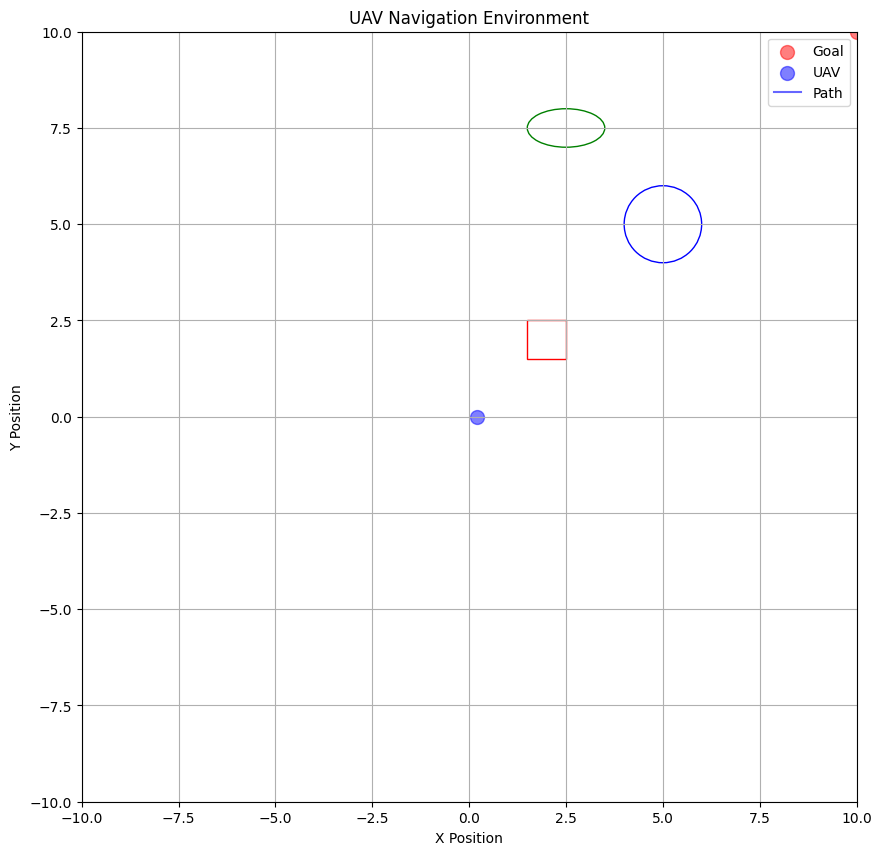

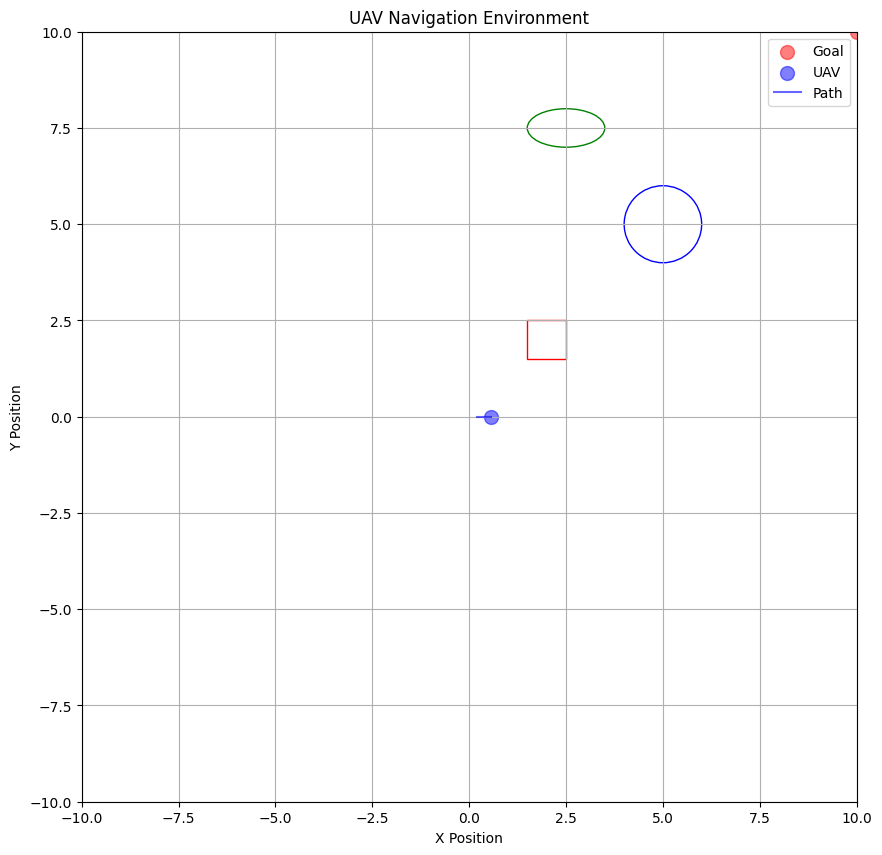

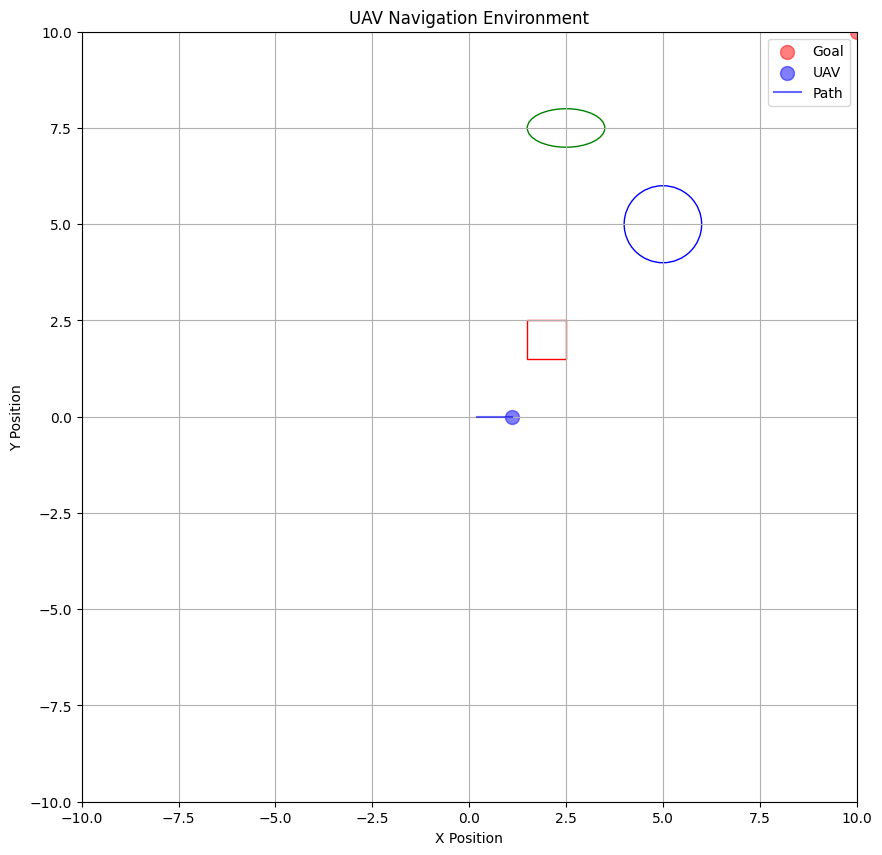

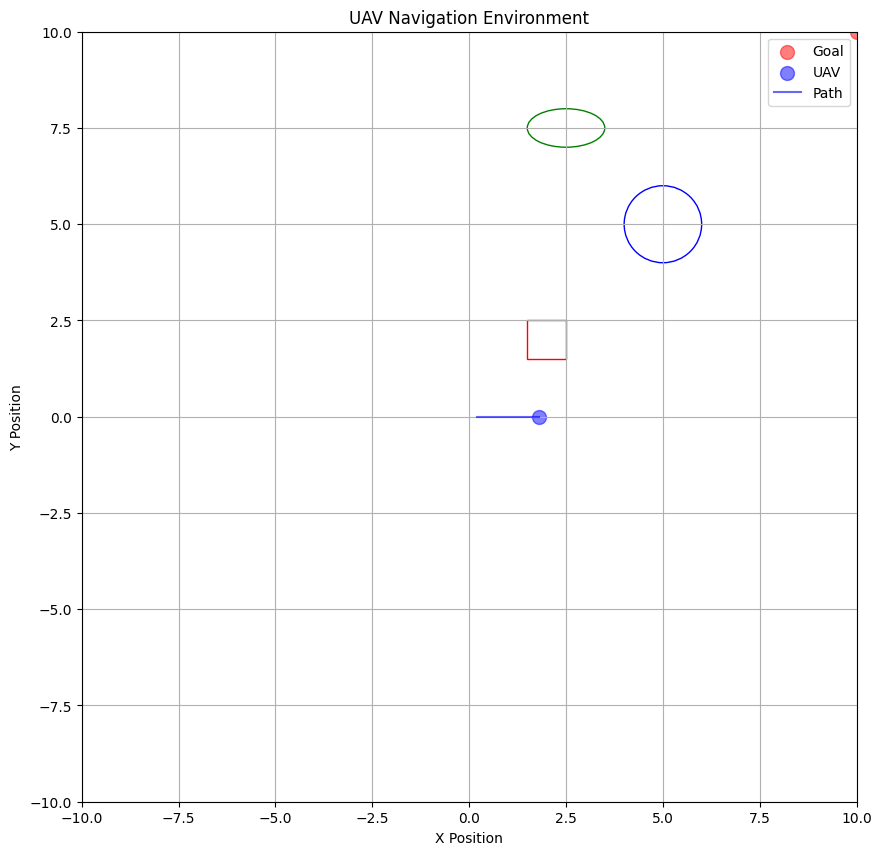

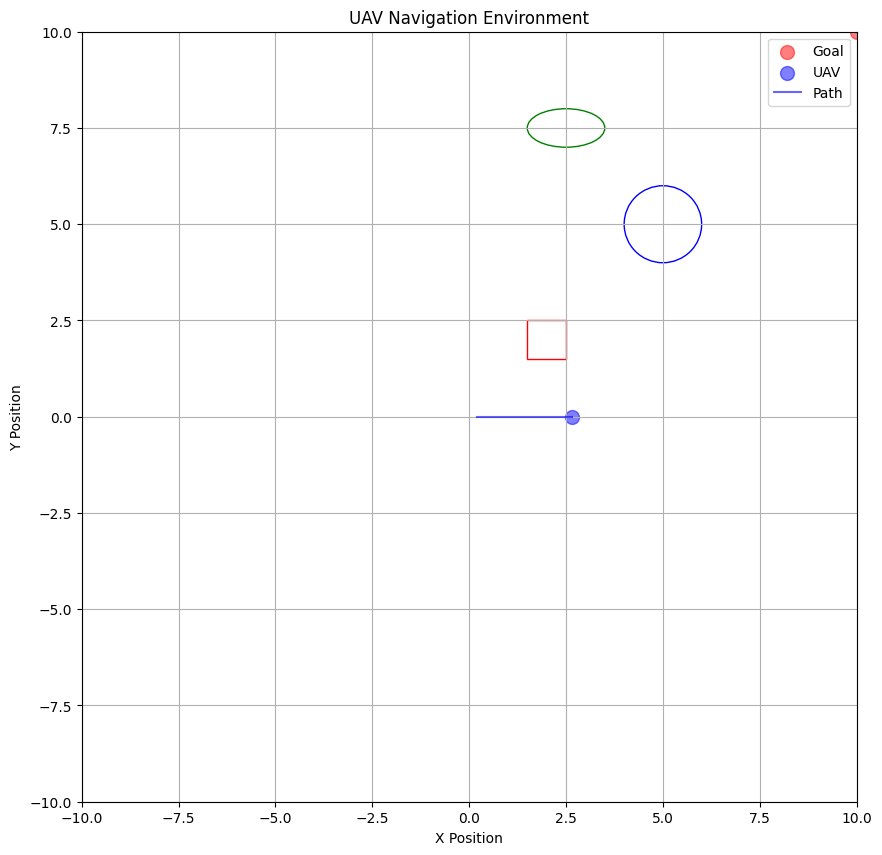

...

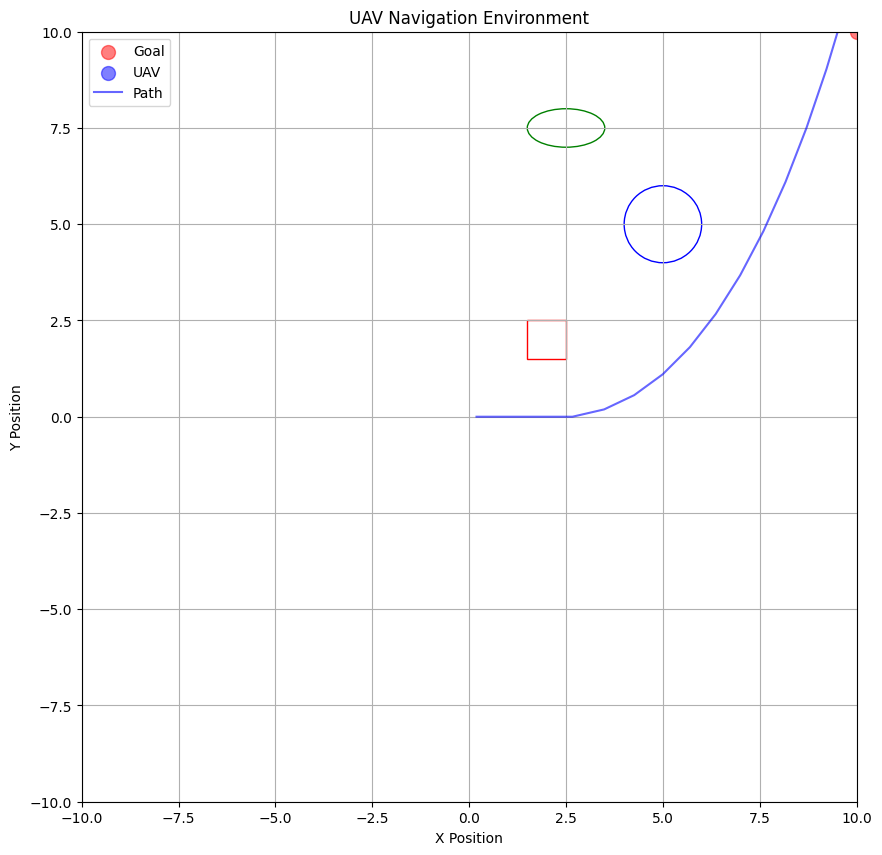

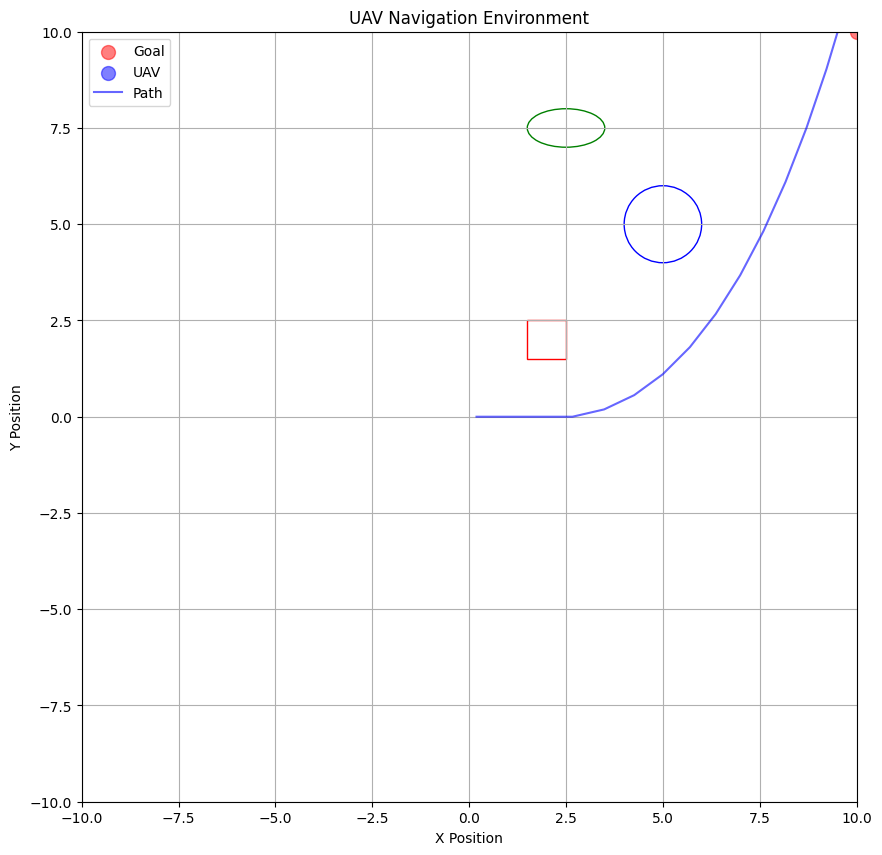

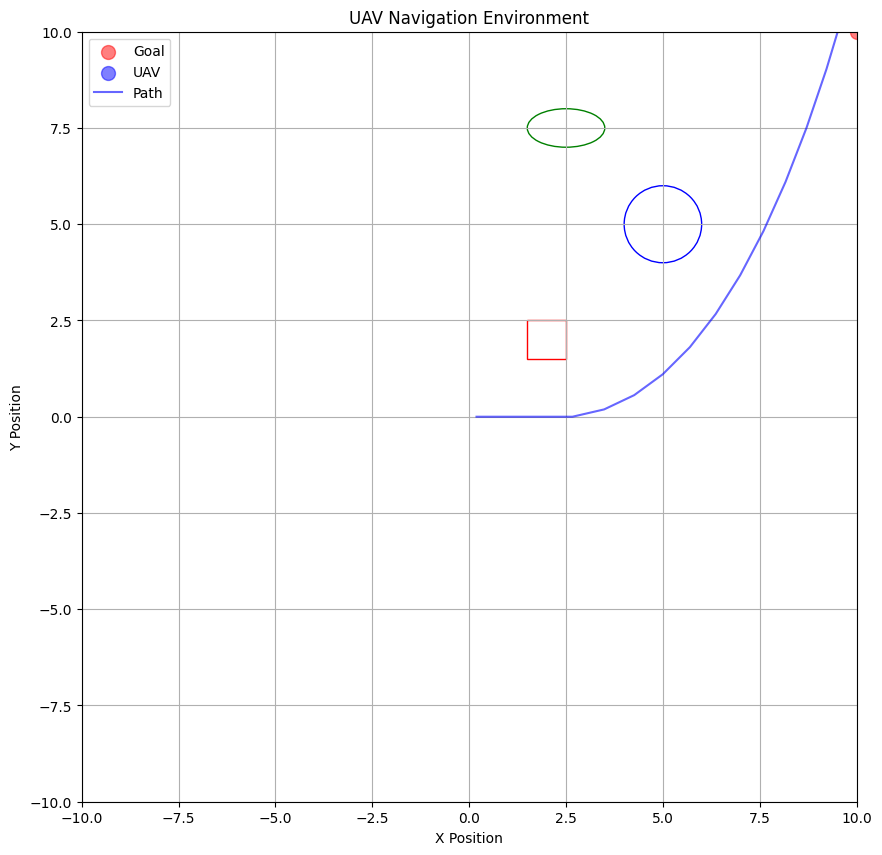

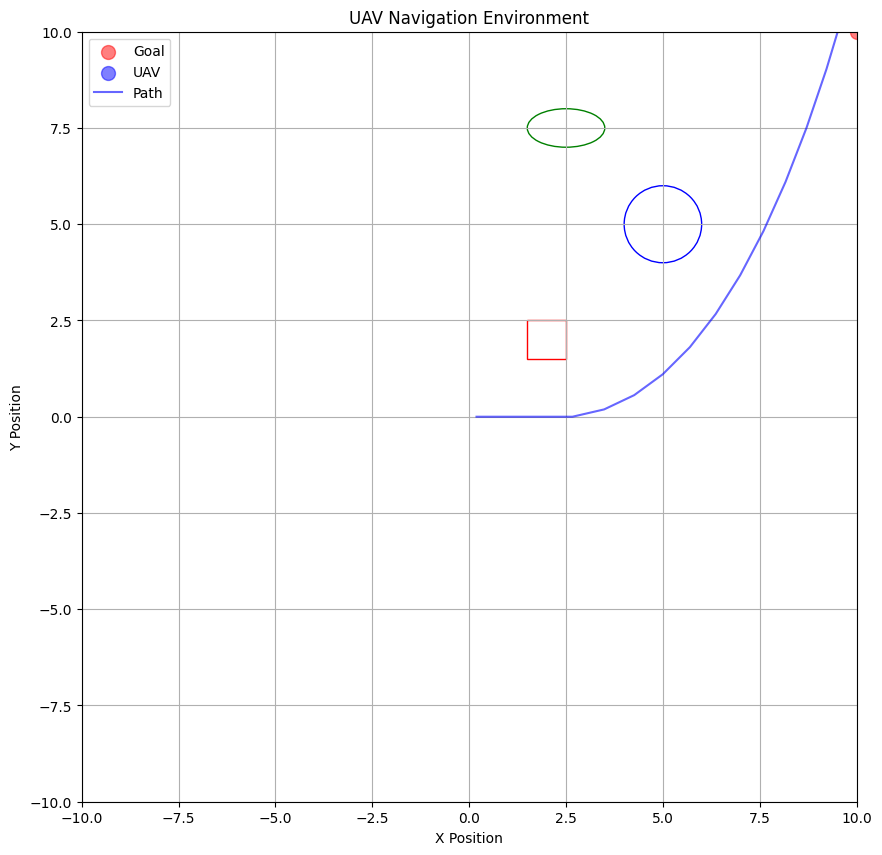

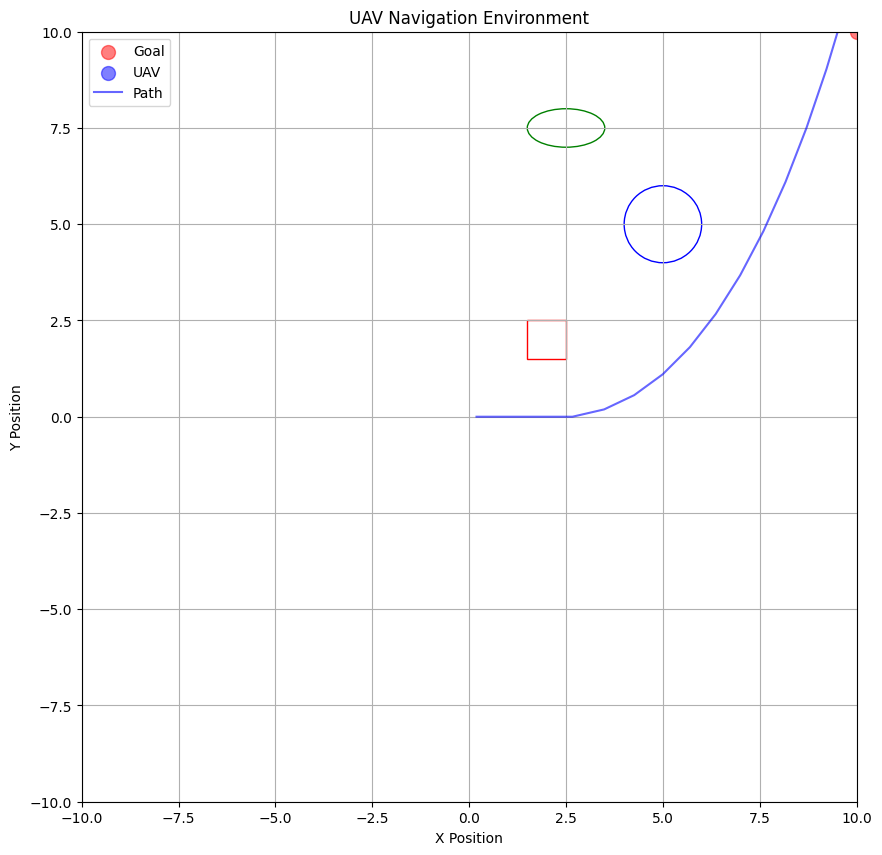

Max steps exceeded.


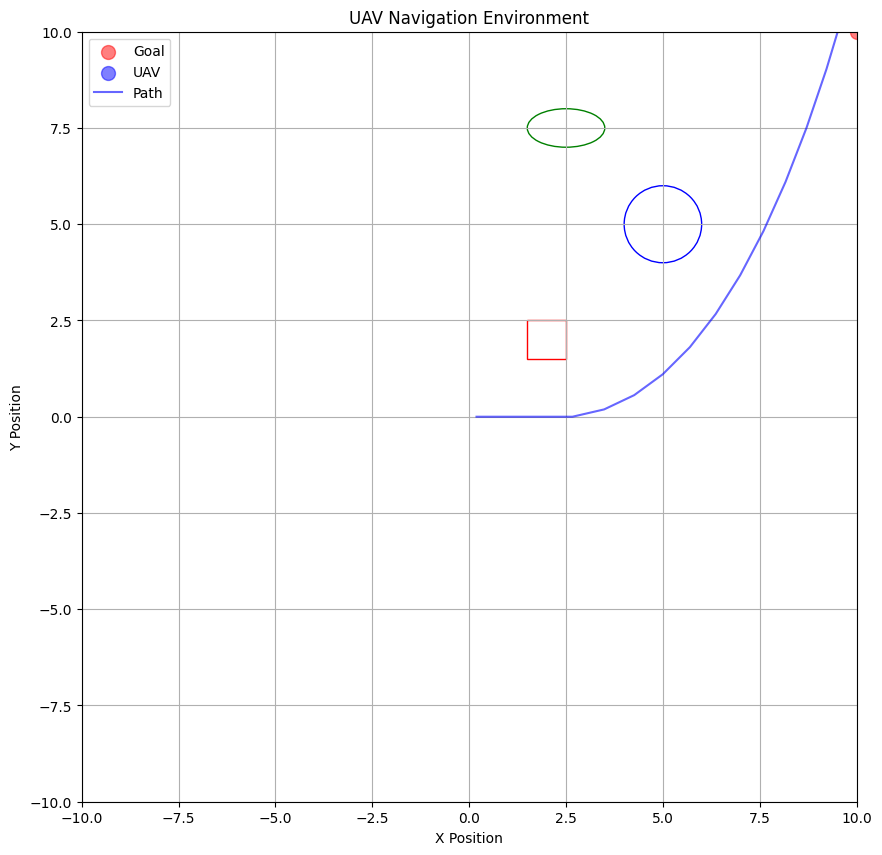

In [11]:
#Visualizing the UAV's 
# Visualize one episode
test_env = UAVEnv()
obs = test_env.reset()
plt.figure(figsize=(8, 8))

for _ in range(500):
    action, _states = model.predict(obs, deterministic=True)
    obs, rewards, dones, info = test_env.step(action)
    test_env.render()
    if dones:
        break

plt.close()  # Close the plot to clean up
